In [73]:
import numpy as np
import pandas as pd
from datetime import datetime
import lightgbm as lgb
from sklearn.metrics import precision_score
from utils.create_train_val import  create_train_val_noagg
from utils.local_manipulations import *
from utils.category_to_num import *
from utils.prepare_data import prepare_data_solo
from scipy.spatial.distance import cdist

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
num = 2
#create_train_val_noagg(num)

In [3]:
#tr.to_parquet('./data/train2.parquet')
#vl.to_parquet('./data/val2.parquet')
tr = pd.read_parquet(f'./data/train{num}.parquet')
vl = pd.read_parquet(f'./data/val{num}.parquet')
tr, vl = prepare_data_solo(tr, vl)
# tr.reset_index(drop=True, inplace=True)
# vl.reset_index(drop=True, inplace=True)

Num - порядковый номер данных. Я менял фичи, поэтому нумервал версию. Надо сказать, некоторые категориальные фичи в итоге считывались как числовые, но так работало даже лучше по моим наблюдениям. Наверно из-за того что природа часов и дней имееи некторый порядок.

In [5]:
X_train, y_train = tr.drop(['totals_transactionRevenue'], axis=1), (tr['totals_transactionRevenue'].values > 0).astype(int)
X_val, y_val = vl.drop(['totals_transactionRevenue'], axis=1), (vl['totals_transactionRevenue'].values > 0).astype(int)
X_train.reset_index(drop=True, inplace=True)
X_val.reset_index(drop=True, inplace=True)

Я готовлю данные, и вырезаю часть из них по наблюдениям из feature research1. Чтобы как-то избавиться от такого дизбаланса

In [6]:
(y_train == 1).sum() / y_train.shape[0], (y_val == 1).sum() / y_val.shape[0]

(0.023491981598521002, 0.024111470613757794)

# Подходы к задаче

## Предсказание купит\не купит

In [214]:
lgb_tr = lgb.Dataset(X_train, y_train)
lgb_val = lgb.Dataset(X_val, y_val)
params = {'objective': 'binary', 'metric': 'binary_logloss', 'eta': 0.01, "num_leaves" : 16,
          'verbosity': -1, 'max_bin': 64, 'bagging_fraction': 0.9,
          'feature_fraction': 0.8, 'min_data': 1, 'bagging_freq': 1, 'early_stopping_round': 50,
          'scale_pos_weight': 0.5}
model_start = lgb.train(
    params, lgb_tr, num_boost_round=1200,
    valid_sets=[lgb_tr, lgb_val], valid_names=['train', 'val'], callbacks=[lgb.log_evaluation(period=50)]
)

[50]	train's binary_logloss: 0.0811386	val's binary_logloss: 0.0822662
[100]	train's binary_logloss: 0.0705531	val's binary_logloss: 0.0711406
[150]	train's binary_logloss: 0.0649922	val's binary_logloss: 0.0653507
[200]	train's binary_logloss: 0.0617071	val's binary_logloss: 0.0619566
[250]	train's binary_logloss: 0.059586	val's binary_logloss: 0.059827
[300]	train's binary_logloss: 0.0581162	val's binary_logloss: 0.0584626
[350]	train's binary_logloss: 0.0571536	val's binary_logloss: 0.0576535
[400]	train's binary_logloss: 0.0563288	val's binary_logloss: 0.0570906
[450]	train's binary_logloss: 0.0557599	val's binary_logloss: 0.0567596
[500]	train's binary_logloss: 0.0552406	val's binary_logloss: 0.0565244
[550]	train's binary_logloss: 0.0547729	val's binary_logloss: 0.0563494
[600]	train's binary_logloss: 0.0543774	val's binary_logloss: 0.0562085
[650]	train's binary_logloss: 0.0539977	val's binary_logloss: 0.056158
[700]	train's binary_logloss: 0.0536099	val's binary_logloss: 0.0560

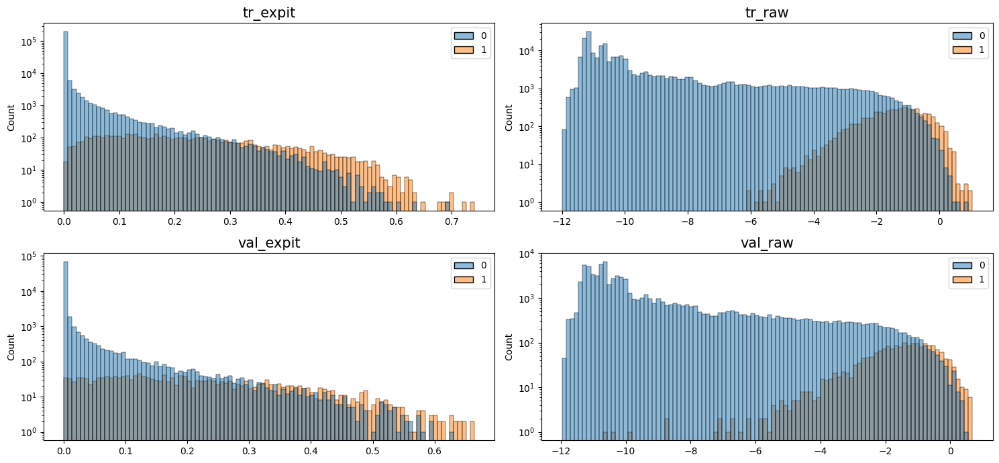

In [215]:
plot_scores(model_start, X_train, y_train, X_val, y_val)

Анализируем картину - все покупки имеют логиты в правой стороне - уже хорошо. Но там же много непокупок, что не очень. Предсказывание является затруднительным. Однако мы видим островки справа, где покупки определяются довольно хорошо. Может засчет их можно вывезти. Так как метрика несимметричная, и ошибаться в большую сторону опасно, то выгодно просто хорошо предсказать тех людей, которые по нашему мнению купят с большой вероятностью.

Для обучения я сделал вес позитивных сэмплов меньше, таким образом штрафуя за них больше, чтобы было возможно найти такие островки в правой части, где почти все сэмплы - с покупкой.

Дальше я решил поиграться c разными подходами.

In [228]:
preds1 = model_start.predict(X_val, raw_score=True)
ind_sort1 = np.argsort(preds1)
preds = model_start.predict(X_train, raw_score=True)
ind_sort = np.argsort(preds)

In [229]:
preds1[ind_sort1][-20:], y_val[ind_sort1][-20:]

(array([0.39414164, 0.39992259, 0.40342635, 0.42024616, 0.43258858,
        0.44708991, 0.45571896, 0.46878414, 0.51071088, 0.52721777,
        0.52836574, 0.53749049, 0.5399529 , 0.54653856, 0.58023947,
        0.59400837, 0.60537217, 0.61254255, 0.65801892, 0.68328759]),
 array([0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1]))

: 

Здесь я смотрю, какой порог по логитам надо выбрать, чтобы справа были в основном классы 1.

Далее я подумал - есть те классы 0 на валидации, которые далеко справа. Решил глянуть, что за сэмплы на них похожи, и выкинуть их, вдруг они тащат класс 0 вправо.

In [217]:
top_n_logits = 50

In [218]:
# X_best1 = get_embeds1(X_val.iloc[ind_sort1][-top_n_logits:].reset_index(drop=True))[~y_val[ind_sort1][-top_n_logits:].astype(bool)]
X_best = get_embeds1(X_train.iloc[ind_sort][-top_n_logits:].reset_index(drop=True))[~y_train[ind_sort][-top_n_logits:].astype(bool)]
X_train_emb = get_embeds1(X_train.reset_index(drop=True))

In [219]:
# ranks = cdist(X_best1, X_train_emb)
# top = 3
# ind = np.argpartition(ranks, top, axis=1)
# ind = np.take(ind, np.arange(top), axis=1)
# ranks = np.take_along_axis(ranks, ind, axis=1)
# ind_part = np.argsort(ranks, axis=1)
# ind1 = np.take_along_axis(ind, ind_part, axis=1)

ranks = cdist(X_best, X_train_emb)
top = 2
ind = np.argpartition(ranks, top, axis=1)
ind = np.take(ind, np.arange(top), axis=1)
ranks = np.take_along_axis(ranks, ind, axis=1)
ind_part = np.argsort(ranks, axis=1)
ind = np.take_along_axis(ind, ind_part, axis=1)

In [220]:
# bad_inds1 = np.concatenate([X_train.iloc[ind1[i]].index.values for i in range(np.sum(1-y_val[ind_sort1][-top_n_logits:]))])
bad_inds = np.concatenate([X_train.iloc[ind[i]].index.values for i in range(np.sum(1-y_train[ind_sort][-top_n_logits:]))])
bad_inds = np.unique(bad_inds)
# bad_inds1 = np.unique(bad_inds1)
# bad_inds = np.concatenate([bad_inds, bad_inds1])

Здесь я решил посмотреть, на что смотрит бустинг. Pageviews - киллер фича какая-то, постоянно выбирает ее.

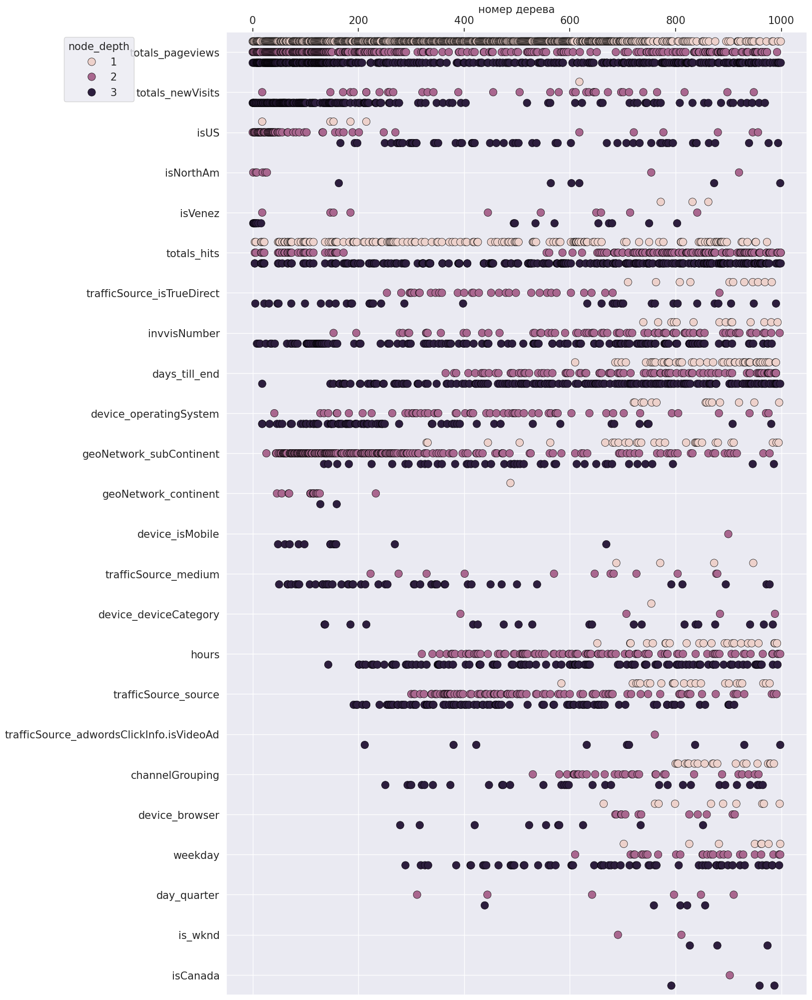

In [11]:
#t = train_model_get_t(X_train, y_train, X_val, y_val, params)
t = model_start.trees_to_dataframe()
plot_tree_info(t)

In [221]:
X_train_clear = X_train.drop(bad_inds)
y_train_clear = np.delete(y_train, bad_inds)

### Тут решаю убрать из теста те сэмплы, которые мешают верной классификации на валидации.

In [222]:
lgb_tr = lgb.Dataset(X_train_clear, y_train_clear)
lgb_val = lgb.Dataset(X_val, y_val)
params = {'objective': 'binary', 'metric': 'binary_logloss', 'eta': 0.01, "num_leaves" : 16,
          'verbosity': -1, 'max_bin': 64, 'bagging_fraction': 0.9,
          'feature_fraction': 0.8, 'min_data': 1, 'bagging_freq': 1, 'early_stopping_round': 50,
          'scale_pos_weight': 0.5}
model = lgb.train(
    params, lgb_tr, num_boost_round=1200,
    valid_sets=[lgb_tr, lgb_val], valid_names=['train', 'val'], callbacks=[lgb.log_evaluation(period=50)]
)

[50]	train's binary_logloss: 0.0811105	val's binary_logloss: 0.0823869
[100]	train's binary_logloss: 0.0705067	val's binary_logloss: 0.07123
[150]	train's binary_logloss: 0.0649527	val's binary_logloss: 0.0654402
[200]	train's binary_logloss: 0.0616798	val's binary_logloss: 0.0619956
[250]	train's binary_logloss: 0.059561	val's binary_logloss: 0.0599118
[300]	train's binary_logloss: 0.0581138	val's binary_logloss: 0.0585243
[350]	train's binary_logloss: 0.0571335	val's binary_logloss: 0.0576943
[400]	train's binary_logloss: 0.0563576	val's binary_logloss: 0.0571131
[450]	train's binary_logloss: 0.0557347	val's binary_logloss: 0.0567567
[500]	train's binary_logloss: 0.0551663	val's binary_logloss: 0.0564972
[550]	train's binary_logloss: 0.0547171	val's binary_logloss: 0.0563035
[600]	train's binary_logloss: 0.0542942	val's binary_logloss: 0.0561807
[650]	train's binary_logloss: 0.0539588	val's binary_logloss: 0.0560528
[700]	train's binary_logloss: 0.0535954	val's binary_logloss: 0.0560

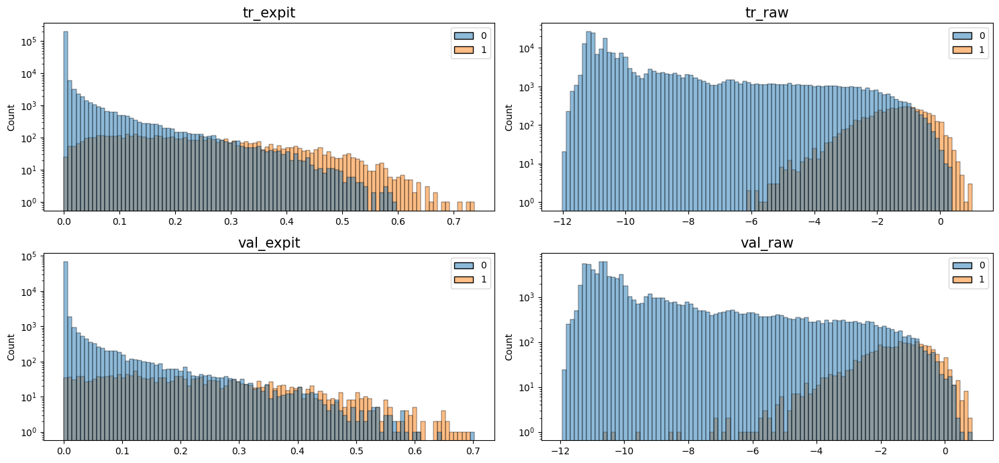

In [223]:
plot_scores(model, X_train_clear, y_train_clear, X_val, y_val)

Картина не сказать чтобы улучшилась.

In [12]:
preds = model_start.predict(X_train, raw_score=True)

### Решил обучить бустинг различать сэмплы, у которых логиты в правой части.

In [13]:
X_train_cut = X_train[preds > -5]
y_train_cut = y_train[preds > -5]

In [14]:
lgb_tr = lgb.Dataset(X_train_cut, y_train_cut)
lgb_val = lgb.Dataset(X_val, y_val)
params = {'objective': 'binary', 'metric': 'binary_logloss', 'eta': 0.01, 
          'verbosity': -1, 'max_bin': 256, 'bagging_fraction': 0.9, "num_leaves" : 15,
          'feature_fraction': 0.8, 'min_data': 1, 'bagging_freq': 1, 'early_stopping_round': 100,
          'scale_pos_weight': 0.5}
model = lgb.train(
    params, lgb_tr, num_boost_round=1000,
    valid_sets=[lgb_tr, lgb_val], valid_names=['train', 'val'], callbacks=[lgb.log_evaluation(period=50)]
)

[50]	train's binary_logloss: 0.408235	val's binary_logloss: 0.168984
[100]	train's binary_logloss: 0.395309	val's binary_logloss: 0.175837
[150]	train's binary_logloss: 0.387841	val's binary_logloss: 0.179722


Как видно, различить такие объекты почти невозмодно. Класс 0 тут очень похож на класс 1.

### Глянем в UMAP

In [15]:
X_train_cut_emb1 = get_embeds1(X_train_cut)
X_train_cut_emb2 = get_embeds2(X_train_cut)

In [16]:
import umap
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles=['int features', 'cat features'], vertical_spacing=0.1)
mapper1 = umap.UMAP(n_neighbors=30, n_jobs=8, metric='euclidean')
embedding1 = mapper1.fit_transform(X_train_cut_emb1)
plot = px.scatter(x=embedding1[:, 0], y=embedding1[:, 1], color=y_train_cut)
fig.add_trace(plot['data'][0], row=1, col=1)
mapper2 = umap.UMAP(n_neighbors=30, n_jobs=8, metric='cosine')
embedding2 = mapper2.fit_transform(X_train_cut_emb2)
plot = px.scatter(x=embedding2[:, 0], y=embedding2[:, 1], color=y_train_cut)
fig.add_trace(plot['data'][0], row=2, col=1)

fig.show()

/home/bogdan/.local/lib/python3.11/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning:

The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.



Все вперемешку. Видимо фичи очень мусорные, и класс 0 очень похож на класс 1. Здесь есть островки, где есть в основном только класс 0, но класс 1 всегда идет вперемешку. Хотя и у него есть свои островки.

### Мб добавить UMAP фичи?

In [31]:
X_train_cut_new = pd.concat([X_train_cut.reset_index(drop=True), pd.DataFrame(embedding1, columns=['int0', 'int1']), pd.DataFrame(embedding2)], axis=1)

In [33]:
emb_val1 = mapper1.transform(get_embeds1(X_val))
emb_val2 = mapper2.transform(get_embeds2(X_val))
X_val_new = pd.concat([X_val.reset_index(drop=True), pd.DataFrame(emb_val1, columns=['int0', 'int1']), pd.DataFrame(emb_val2)], axis=1)

In [36]:
lgb_tr = lgb.Dataset(X_train_cut_new, y_train_cut)
lgb_val = lgb.Dataset(X_val_new, y_val)
params = {'objective': 'binary', 'metric': 'binary_logloss', 'eta': 0.001, 
          'verbosity': -1, 'max_bin': 256, 'bagging_fraction': 0.9, "num_leaves" : 15,
          'feature_fraction': 0.8, 'min_data': 1, 'bagging_freq': 1, 'early_stopping_round': 100,
          'scale_pos_weight': 1}
model = lgb.train(
    params, lgb_tr, num_boost_round=1000,
    valid_sets=[lgb_tr, lgb_val], valid_names=['train', 'val'], callbacks=[lgb.log_evaluation(period=50)]
)

[50]	train's binary_logloss: 0.435469	val's binary_logloss: 0.215717
[100]	train's binary_logloss: 0.429428	val's binary_logloss: 0.217123


Очевидно не помогло.

### Глянем в PCA

In [20]:
tr_embs = get_embeds1(X_train)
val_embs = get_embeds1(X_val)

In [21]:
from sklearn.decomposition import PCA

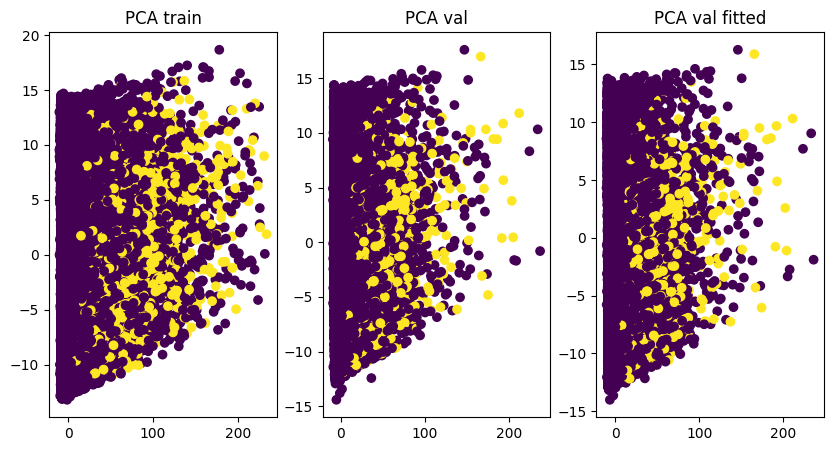

In [22]:
pca = PCA(n_components=2)
X_pca_train = pca.fit_transform(tr_embs)
X_pca_val_fit = pca.transform(val_embs)
X_pca_val = pca.fit_transform(val_embs)

# tsne = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=3)
# X_tsne_train = tsne.fit_transform(tr_embs)
# X_tsne_val = tsne.fit_transform(val_embs)

fig, axes = plt.subplots(1, 3, figsize=(10, 5))
axes[0].scatter(X_pca_train[:, 0], X_pca_train[:, 1], c=y_train)
axes[0].set_title('PCA train')
# axes[0][1].scatter(X_tsne_train[:, 0], X_tsne_train[:, 1], c=y_train)
# axes[0][1].set_title('TSNE train')
# axes[0][1].legend()
axes[1].scatter(X_pca_val[:, 0], X_pca_val[:, 1], c=y_val)
axes[1].set_title('PCA val')
axes[2].scatter(X_pca_val_fit[:, 0], X_pca_val_fit[:, 1], c=y_val)
axes[2].set_title('PCA val fitted')
# axes[1][1].scatter(X_tsne_val[:, 0], X_tsne_val[:, 1], c=y_val)
# axes[1][1].set_title('TSNE val')
# axes[1][1].legend()
plt.show()

Вообще, здесь есть какие-то проблески. класс 1 находится правее на картинке, так что некоторые класс 1 объекты можно извлечь.

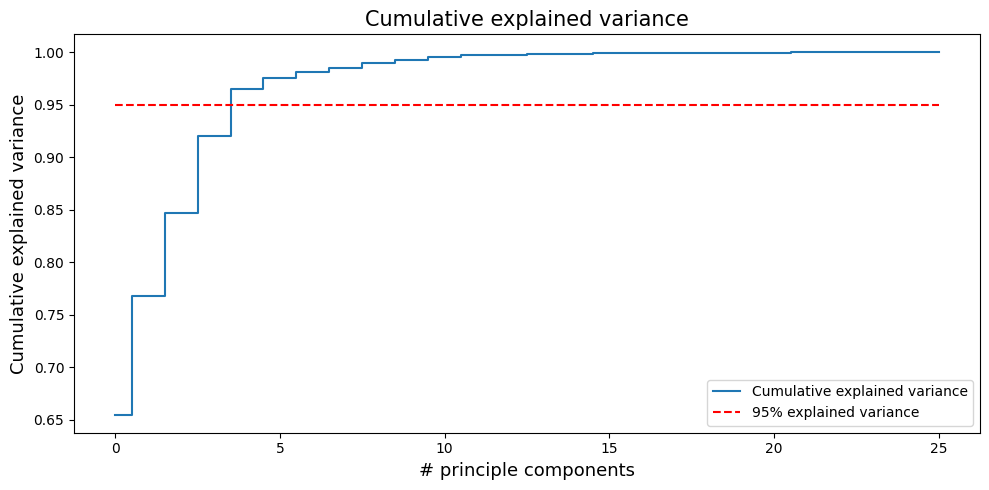

In [23]:
pca = PCA()
X_train_pca = pca.fit_transform(tr_embs)
expvar = pca.explained_variance_ratio_
cum_sum = np.cumsum(expvar)

plt.figure(figsize=(10, 5))
plt.step(range(0,len(cum_sum)), cum_sum, where='mid',label='Cumulative explained variance')
plt.plot(range(0,len(cum_sum)), [0.95 for _ in range(0,len(cum_sum))], 
         linestyle='--', c='r', label='95% explained variance')
plt.title('Cumulative explained variance', fontsize=15)
plt.ylabel('Cumulative explained variance', fontsize=13)
plt.xlabel('# principle components', fontsize=13)
plt.legend(loc='best')
plt.tight_layout()
plt.show()

По сути, половина фичей у меня - не очень нужные кажется.

### Обучим на PCA данных 

In [24]:
X_train_pca = X_train_pca[:, :5]
X_val_pca = pca.transform(val_embs)
X_val_pca = X_val_pca[:, :5]
lgb_tr = lgb.Dataset(X_train_pca, y_train)
lgb_val = lgb.Dataset(X_val_pca, y_val)
params = {'objective': 'binary', 'metric': 'binary_logloss', 'eta': 0.01, "num_leaves" : 16,
          'verbosity': -1, 'max_bin': 64, 'bagging_fraction': 0.9,
          'feature_fraction': 0.8, 'min_data': 1, 'bagging_freq': 1, 'early_stopping_round': 50,
          'scale_pos_weight': 0.5}
model = lgb.train(
    params, lgb_tr, num_boost_round=1200,
    valid_sets=[lgb_tr, lgb_val], valid_names=['train', 'val'], callbacks=[lgb.log_evaluation(period=50)]
)

[50]	train's binary_logloss: 0.0852525	val's binary_logloss: 0.085851
[100]	train's binary_logloss: 0.0761985	val's binary_logloss: 0.0764864
[150]	train's binary_logloss: 0.0709331	val's binary_logloss: 0.0711786
[200]	train's binary_logloss: 0.0680008	val's binary_logloss: 0.0683007
[250]	train's binary_logloss: 0.0658139	val's binary_logloss: 0.0662503
[300]	train's binary_logloss: 0.0642845	val's binary_logloss: 0.0650251
[350]	train's binary_logloss: 0.0630914	val's binary_logloss: 0.0641526
[400]	train's binary_logloss: 0.062203	val's binary_logloss: 0.0636064
[450]	train's binary_logloss: 0.0615259	val's binary_logloss: 0.0632653
[500]	train's binary_logloss: 0.0609451	val's binary_logloss: 0.0630767
[550]	train's binary_logloss: 0.0604952	val's binary_logloss: 0.0629494
[600]	train's binary_logloss: 0.0600775	val's binary_logloss: 0.0628308
[650]	train's binary_logloss: 0.0597472	val's binary_logloss: 0.062768
[700]	train's binary_logloss: 0.0594268	val's binary_logloss: 0.0627

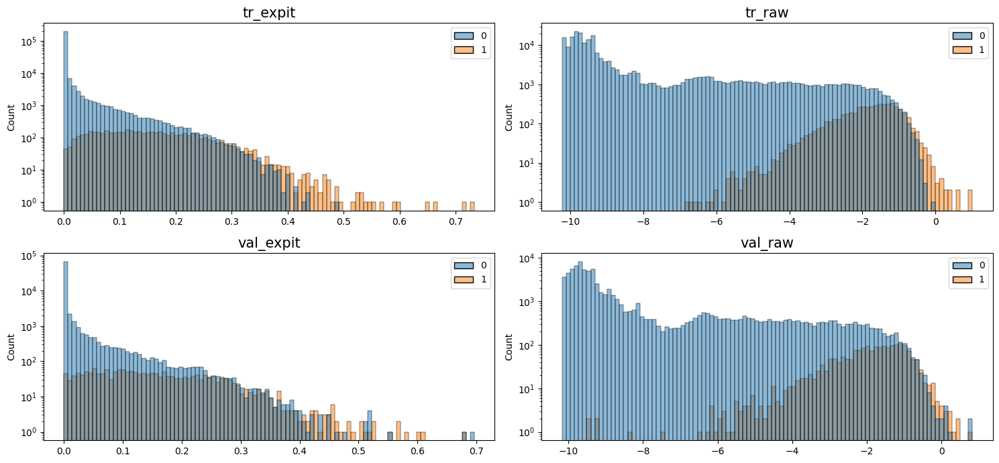

In [25]:
plot_scores(model, X_train_pca, y_train, X_val_pca, y_val)

Ну трейн довольно неплох, но валидация прям не очень. Класс 0 затесаля в наши ряды.

### Добавим PCA фичи?

In [29]:
X_train_pca_df = pd.DataFrame({f'pca_{i}': v for i, v in enumerate(X_train_pca.T)})
X_val_pca_df = pd.DataFrame({f'pca_{i}': v for i, v in enumerate(X_val_pca.T)})


In [30]:
X_train1 = pd.concat([X_train, X_train_pca_df], axis=1)
X_val1 = pd.concat([X_val, X_val_pca_df], axis=1)

In [31]:
lgb_tr = lgb.Dataset(X_train1, y_train)
lgb_val = lgb.Dataset(X_val1, y_val)
params = {'objective': 'binary', 'metric': 'binary_logloss', 'eta': 0.01, "num_leaves" : 16,
          'verbosity': -1, 'max_bin': 64, 'bagging_fraction': 0.9,
          'feature_fraction': 0.8, 'min_data': 1, 'bagging_freq': 1, 'early_stopping_round': 50,
          'scale_pos_weight': 0.5}
model = lgb.train(
    params, lgb_tr, num_boost_round=1200,
    valid_sets=[lgb_tr, lgb_val], valid_names=['train', 'val'], callbacks=[lgb.log_evaluation(period=50)]
)

[50]	train's binary_logloss: 0.0809202	val's binary_logloss: 0.0816797
[100]	train's binary_logloss: 0.0703499	val's binary_logloss: 0.0705637
[150]	train's binary_logloss: 0.0648145	val's binary_logloss: 0.0648372
[200]	train's binary_logloss: 0.0615407	val's binary_logloss: 0.0615621
[250]	train's binary_logloss: 0.0593529	val's binary_logloss: 0.0595466
[300]	train's binary_logloss: 0.0578948	val's binary_logloss: 0.0582812
[350]	train's binary_logloss: 0.0567821	val's binary_logloss: 0.0574936
[400]	train's binary_logloss: 0.0560411	val's binary_logloss: 0.0570594
[450]	train's binary_logloss: 0.055351	val's binary_logloss: 0.0567006
[500]	train's binary_logloss: 0.0548247	val's binary_logloss: 0.0564841
[550]	train's binary_logloss: 0.0543622	val's binary_logloss: 0.0563501
[600]	train's binary_logloss: 0.053944	val's binary_logloss: 0.0562398
[650]	train's binary_logloss: 0.0535197	val's binary_logloss: 0.056162
[700]	train's binary_logloss: 0.0531467	val's binary_logloss: 0.0560

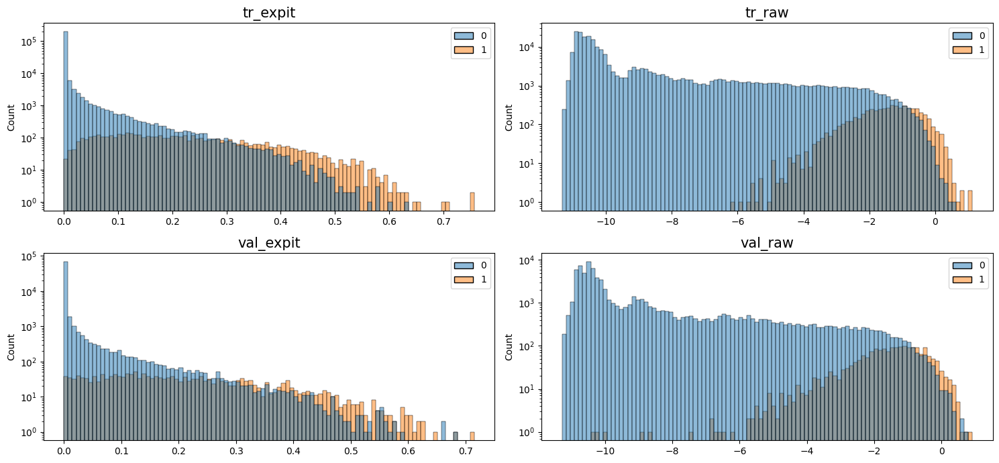

In [32]:
plot_scores(model, X_train1, y_train, X_val1, y_val)

Опять, ситуация не особо улучшилась. Кажется, больше, чем мленький островок справа нам не вытащить

In [24]:
preds = model.predict(X_val1, raw_score=True)
ind_sort = np.argsort(preds)

In [25]:
preds[ind_sort][-15:], y_val[ind_sort][-15:]

(array([0.31361937, 0.31451149, 0.32208144, 0.32865865, 0.40108777,
        0.40657346, 0.43299197, 0.45888156, 0.63878601, 0.67856331,
        0.73230036, 0.73796315, 0.76809346, 0.87691594, 2.03107948]),
 array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]))

### NearMiss?

In [42]:
from imblearn.under_sampling import NearMiss

In [27]:
tr_new = pd.concat([X_train1, X_val1]).reset_index(drop=True)
y_new = np.concatenate([y_train, y_val])
tr_new_embs = get_embeds2(X_train1)
val_new_embs = get_embeds2(X_val1)

In [51]:
nm = NearMiss(version=3)

In [52]:
X_res, y_res = nm.fit_resample(tr_new_embs, y_train)

In [61]:
lgb_tr = lgb.Dataset(X_res, y_res)
lgb_val = lgb.Dataset(val_new_embs, y_val)
params = {'objective': 'binary', 'metric': 'binary_logloss', 'eta': 0.01, "num_leaves" : 16,
          'verbosity': -1, 'max_bin': 64, 'bagging_fraction': 0.9,
          'feature_fraction': 0.8, 'min_data': 1, 'bagging_freq': 1, 'early_stopping_round': 50,
          'scale_pos_weight': 0.5}
model = lgb.train(
    params, lgb_tr, num_boost_round=1200,
    valid_sets=[lgb_tr, lgb_val], valid_names=['train', 'val'], callbacks=[lgb.log_evaluation(period=50)]
)

[50]	train's binary_logloss: 0.700727	val's binary_logloss: 0.43432
[100]	train's binary_logloss: 0.757651	val's binary_logloss: 0.311518
[150]	train's binary_logloss: 0.818966	val's binary_logloss: 0.242277
[200]	train's binary_logloss: 0.868942	val's binary_logloss: 0.199521
[250]	train's binary_logloss: 0.902876	val's binary_logloss: 0.174625
[300]	train's binary_logloss: 0.921297	val's binary_logloss: 0.158625
[350]	train's binary_logloss: 0.927688	val's binary_logloss: 0.149865
[400]	train's binary_logloss: 0.923461	val's binary_logloss: 0.145422
[450]	train's binary_logloss: 0.914793	val's binary_logloss: 0.14227
[500]	train's binary_logloss: 0.901992	val's binary_logloss: 0.140526
[550]	train's binary_logloss: 0.886917	val's binary_logloss: 0.141363


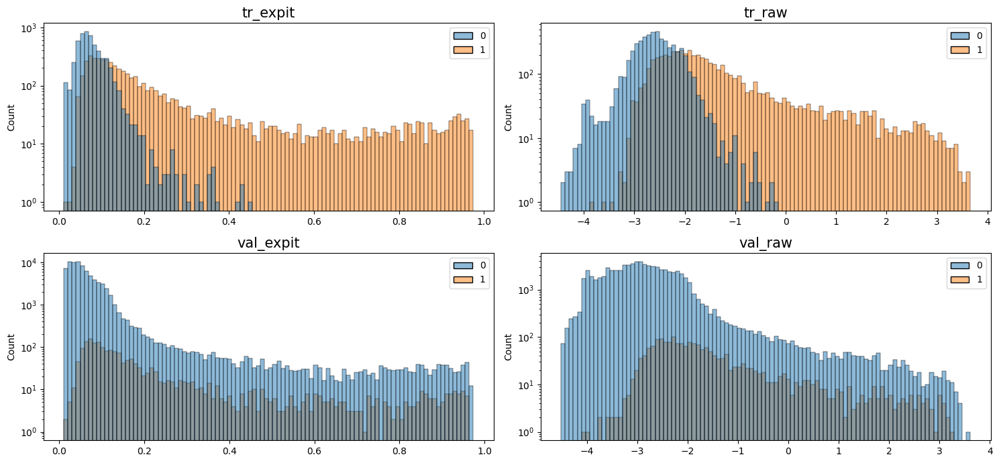

In [62]:
plot_scores(model, X_res, y_res, val_new_embs, y_val)

Все совсем ужасно, не будем использовать

### Категоризация фичей не помогла.

Например, я разбил total_pageviews на чанки, думал может другие фичи появятся - но нет.

In [51]:
# bin_num = 30
# cats, bins = pd.cut(tr['totals_pageviews'], bins=bin_num, labels=[f'bin_{i}' for i in range(bin_num)], retbins=True)
# tr['pageview_chunk'] = cats
# vl['pageview_chunk'] = pd.cut(vl['totals_pageviews'], bins=bins, labels=[f'bin_{i}' for i in range(bin_num)])
# cats, bins = pd.cut(tr['totals_pageviews'], bins=bin_num, labels=[f'bin_{i}' for i in range(bin_num)], retbins=True)
# tr['pageview_chunk'] = cats
# vl['pageview_chunk'] = pd.cut(vl['totals_pageviews'], bins=bins, labels=[f'bin_{i}' for i in range(bin_num)])

# cats, bins = pd.cut(tr['totals_hits'], bins=bin_num, labels=[f'bin_{i}' for i in range(bin_num)], retbins=True)
# tr['hits_chunk'] = cats
# vl['hits_chunk'] = pd.cut(vl['totals_hits'], bins=bins, labels=[f'bin_{i}' for i in range(bin_num)])
# cats, bins = pd.cut(tr['totals_hits'], bins=bin_num, labels=[f'bin_{i}' for i in range(bin_num)], retbins=True)
# tr['hits_chunk'] = cats
# vl['hits_chunk'] = pd.cut(vl['totals_hits'], bins=bins, labels=[f'bin_{i}' for i in range(bin_num)])

### Early stopping с кастомной метрикой? неа, мимо

In [146]:
def my_metric(pred, true):
    metric_name = 'my_metric'
    actuals = true.get_label() if isinstance(true, lgb.Dataset) else true
    actuals = actuals.astype(int)
    sort_ind = np.argsort(pred)
    pred = pred[sort_ind][-20:]
    actuals = actuals[sort_ind][-20:]
    value = np.sum(actuals * pred)
    
    is_higher_better = True
    return metric_name, value, is_higher_better

def first_grad(predt, dmat):
    y = dmat.get_label() if isinstance(dmat, lgb.Dataset) else dmat
    return 1-y

def second_grad(predt, dmat):
    y = dmat.get_label() if isinstance(dmat, lgb.Dataset) else dmat
    return np.zeros_like(predt)

def my_obj(predt, dmat):
    # predt[predt < -1] = -1 + 1e-6
    grad = first_grad(predt, dmat)
    hess = second_grad(predt, dmat)
    return grad, hess

In [131]:
lgb_tr = lgb.Dataset(X_train, y_train)
lgb_val = lgb.Dataset(X_val, y_val)
params = {'objective': 'binary', 'metric': 'binary_logloss', 'eta': 0.01, 
          'verbosity': -1, 'max_bin': 256, 'bagging_fraction': 0.9,
          'feature_fraction': 0.8, 'min_data': 1, 'bagging_freq': 1, 'early_stopping_round': 200,
          'scale_pos_weight': 0.5}
model = lgb.train(
    params, lgb_tr, num_boost_round=1200,
    valid_sets=[lgb_tr, lgb_val], valid_names=['train', 'val'], callbacks=[lgb.log_evaluation(period=50)],
    feval=my_metric
)

[50]	train's binary_logloss: 0.0802693	train's precision: 3.73894	val's binary_logloss: 0.0832018	val's precision: 3.0032
[100]	train's binary_logloss: 0.0691694	train's precision: 4.89353	val's binary_logloss: 0.0718842	val's precision: 5.15222
[150]	train's binary_logloss: 0.0634507	train's precision: 6.42455	val's binary_logloss: 0.0662168	val's precision: 6.34485
[200]	train's binary_logloss: 0.0600341	train's precision: 7.31862	val's binary_logloss: 0.0628896	val's precision: 6.76154
[250]	train's binary_logloss: 0.0577974	train's precision: 8.50071	val's binary_logloss: 0.0608368	val's precision: 7.35922
[300]	train's binary_logloss: 0.0563397	train's precision: 9.59291	val's binary_logloss: 0.0596253	val's precision: 8.29894
[350]	train's binary_logloss: 0.0551991	train's precision: 10.1019	val's binary_logloss: 0.0588282	val's precision: 8.91914
[400]	train's binary_logloss: 0.054228	train's precision: 10.6137	val's binary_logloss: 0.058316	val's precision: 9.23013
[450]	train'

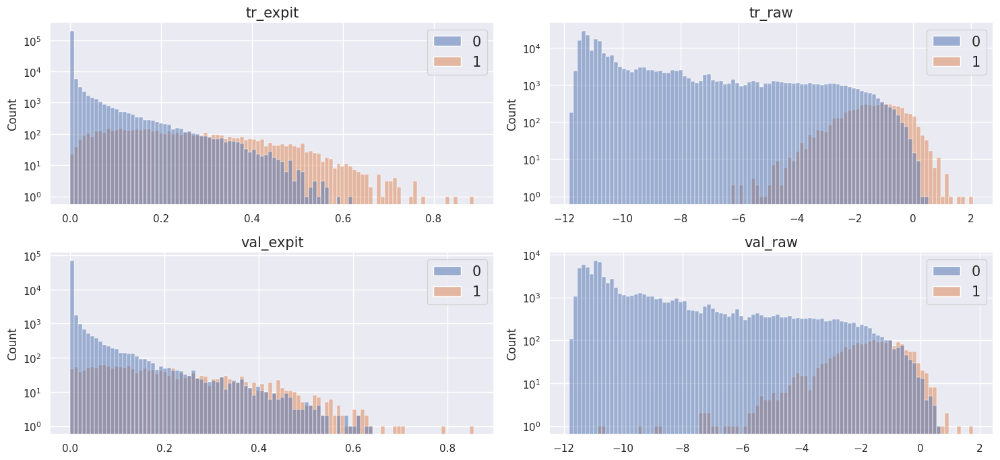

In [132]:
plot_scores(model, X_train, y_train, X_val, y_val)